## Graph tool

- read paper
- add two more small countries
- play around with the order of graphs according to lecture notes
- add time dimension
- no connection with the real world in the decription of the graphs

In [ ]:
import graph_tool.all as gt

/usr/lib/python3/dist-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.17.3 and <1.25.0 is required for this version of SciPy (detected version 1.26.1
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [2]:
#import graph_tool.all as gt
import matplotlib.pyplot as plt
import numpy as np
import matplotlib

### example of loading a pre-defined graph

In [ ]:
countries_years = [
    ('AT', '2016'),
    ('CY', '2008'),
    ('CY', '2016'),
    ('BG', '2008'),
    ('BG', '2016'),
    ('DK', '2008'),
    ('DK', '2016')
]

# Create a dictionary to hold your data
datasets = {}

# Iterate over each country/year pair and retrieve the corresponding dataset
for country_code, year in countries_years:
    dataset_name = f"{country_code}_{year}"  # This will be the key, e.g., 'AT_2016'
    full_dataset_name = f"eu_procurements_alt/{dataset_name}"  # This is the full path used to retrieve the dataset
    datasets[dataset_name] = gt.collection.ns[full_dataset_name]

# Now we have a dictionary where the keys are 'AT_2016', 'CY_2008', etc.,
# and the values are the data you've retrieved

### basic numbers

In [4]:
print(g)

<Graph object, undirected, with 2271 vertices and 2324 edges, 2 internal vertex properties, 2 internal edge properties, 5 internal graph properties, at 0x7f5cf7717580>


In [5]:
g.list_properties()

name             (graph)   (type: string, val: eu_procurements_alt (AT_2008))
description      (graph)   (type: string, val: These 234 networks represent the
                                               annual national public
                                               procurement markets of 26
                                               European countries from
                                               2008-2016, inclusive. Data is
                                               sourced from Tenders Electronic
                                               Daily (TED), the official
                                               procurement portal of the
                                               European Union.  Nodes with the
                                               suffix "_i" are issuers
                                               (sometimes referred to as
                                               buyers) of public contracts, for
                       

### in- and out-degree distribution

In [54]:
in_hist = gt.vertex_hist(g, "in")

out_hist = gt.vertex_hist(g, "out")

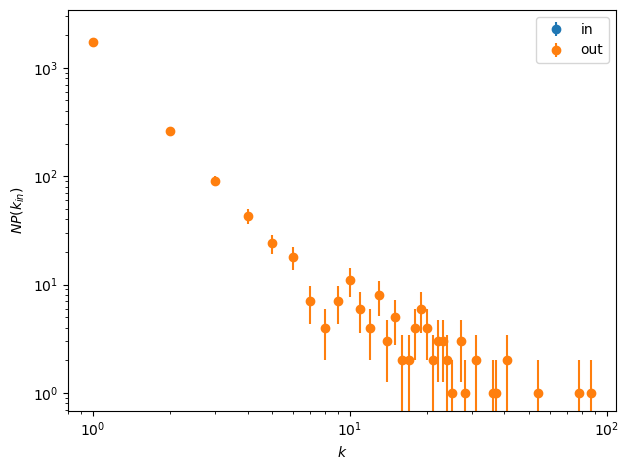

In [7]:
y = in_hist[0]
err = np.sqrt(in_hist[0])
plt.errorbar(in_hist[1][:-1], in_hist[0], fmt="o", yerr=err,
        label="in")

y = out_hist[0]
err = np.sqrt(out_hist[0])
plt.errorbar(out_hist[1][:-1], out_hist[0], fmt="o", yerr=err,
        label="out")

plt.yscale("log")
plt.xscale("log")

plt.xlabel("$k$")
plt.ylabel("$NP(k_{in})$")

plt.tight_layout()
plt.legend()

### select a subgraph for visualization

In [8]:
u = gt.extract_largest_component(g)

print(u)

u = gt.Graph(u, prune=True)

print(u)

<GraphView object, undirected, with 1684 vertices and 1921 edges, 2 internal vertex properties, 2 internal edge properties, 5 internal graph properties, edges filtered by (<EdgePropertyMap object with value type 'bool', for Graph 0x7f5c18542410, at 0x7f5c18542980>, False), vertices filtered by (<VertexPropertyMap object with value type 'bool', for Graph 0x7f5c18542410, at 0x7f5c185427d0>, False), at 0x7f5c18542410>
<Graph object, undirected, with 1684 vertices and 1921 edges, 2 internal vertex properties, 2 internal edge properties, 5 internal graph properties, at 0x7f5c185402e0>


### spring layout

In [9]:
pos = gt.sfdp_layout(u)

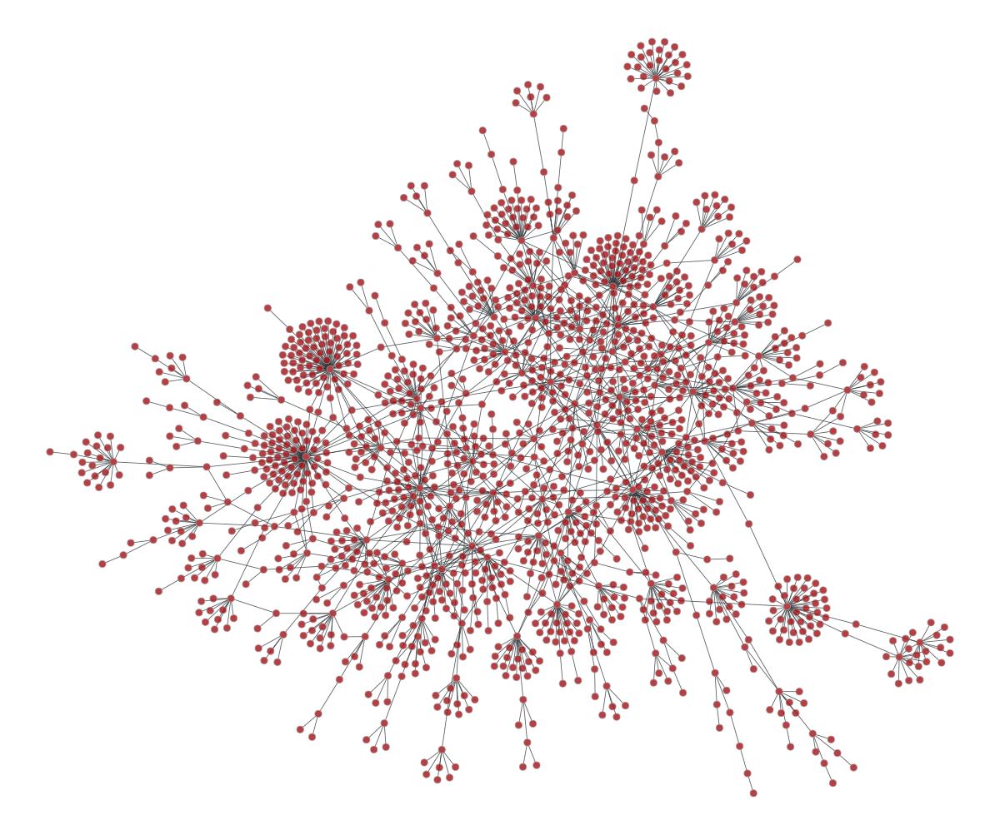

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7f5c185402e0, at 0x7f5c18542500>

In [10]:
gt.graph_draw(u, pos)

In [11]:
pos_fr = gt.fruchterman_reingold_layout(u, n_iter=100)

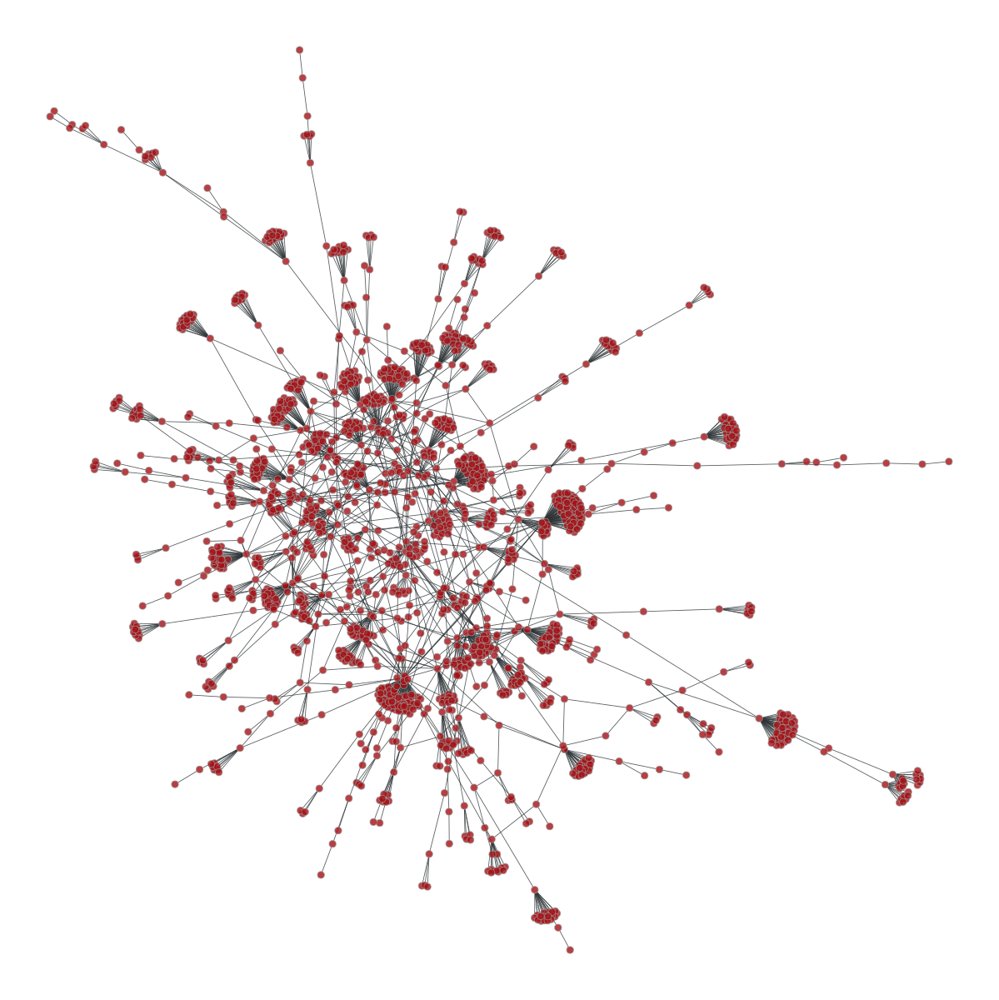

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7f5c185402e0, at 0x7f5c18542260>

In [12]:
gt.graph_draw(u, pos_fr)

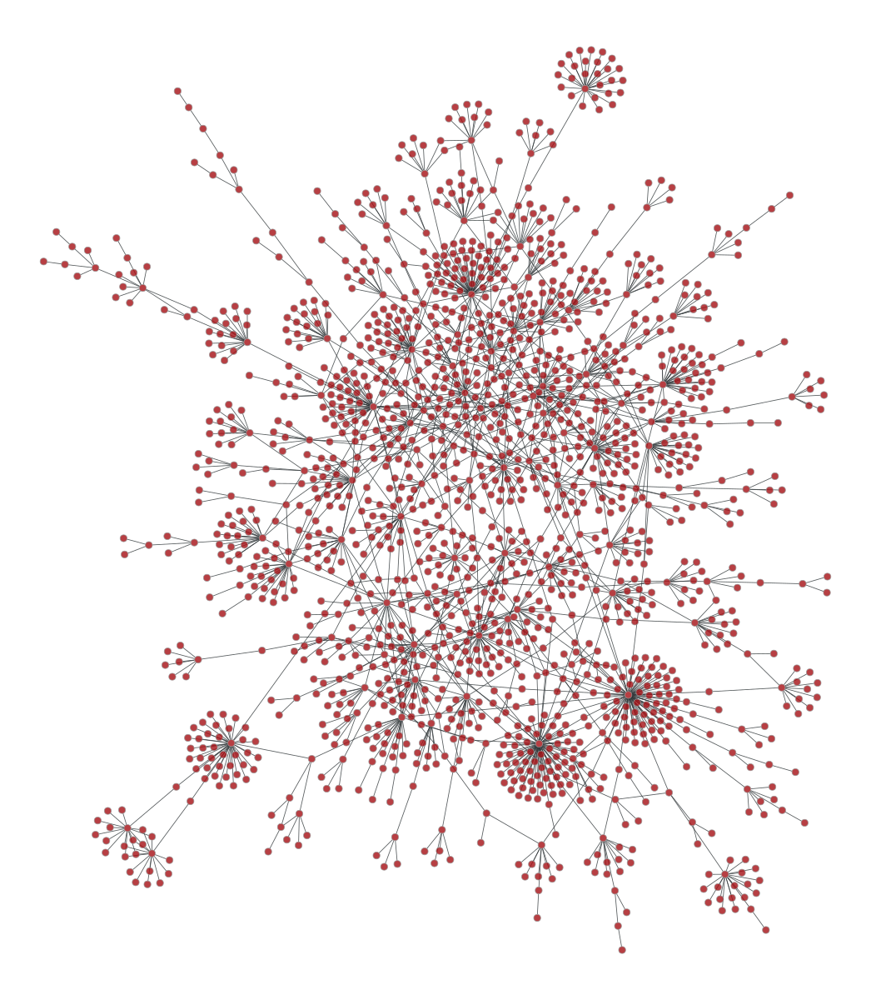

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7f5c185402e0, at 0x7f5c18543d30>

In [13]:
gt.graph_draw(u, pos=u.vp["_pos"])

In [14]:
import geopandas as gpd

countries = gpd.read_file(gpd.datasets.get_path("naturalearth_lowres"))

/tmp/ipykernel_14719/2637854982.py:3: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  countries = gpd.read_file(gpd.datasets.get_path("naturalearth_lowres"))


In [15]:
pos_tree = gt.radial_tree_layout(u, 0)

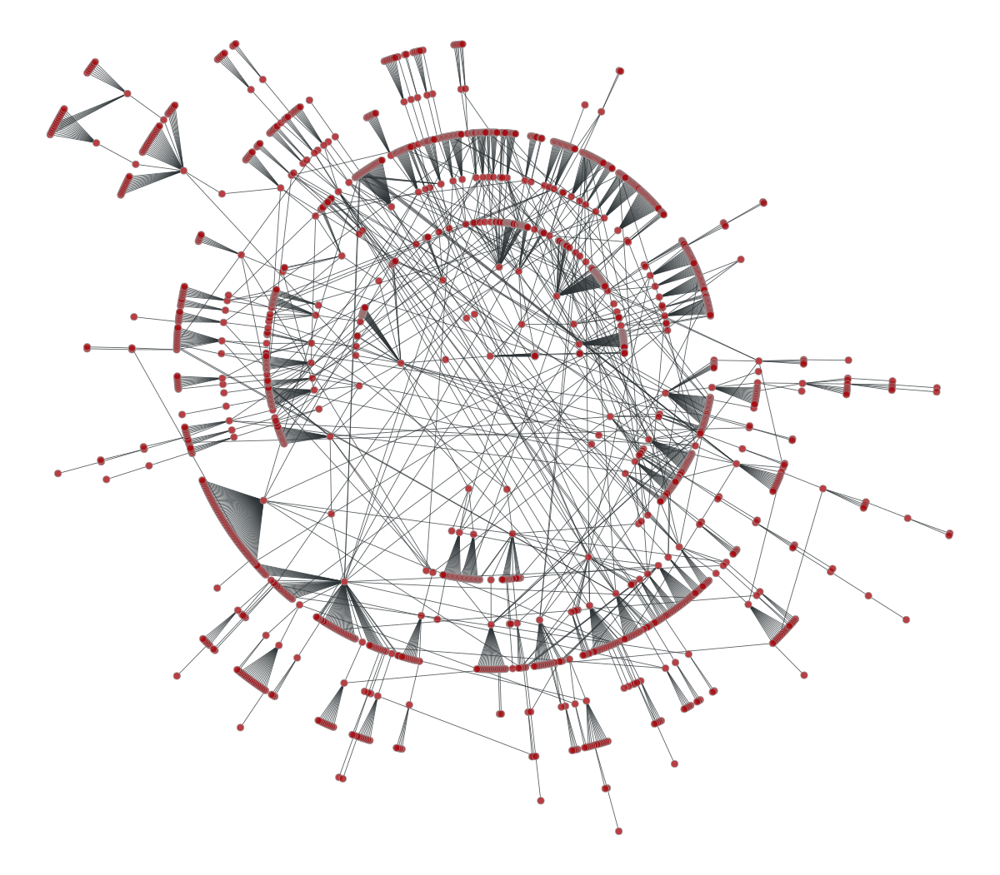

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7f5c185402e0, at 0x7f5c0900a3e0>

In [16]:
gt.graph_draw(u, pos_tree)

In [17]:
maximum = max(u.get_in_degrees(u.get_vertices()))

print(np.where(u.get_in_degrees(u.get_vertices()) == maximum))
print(u.get_in_degrees(u.get_vertices()))

(array([   0,    1,    2, ..., 1681, 1682, 1683]),)
[0 0 0 ... 0 0 0]


In [18]:
pos_tree = gt.radial_tree_layout(u, 1)

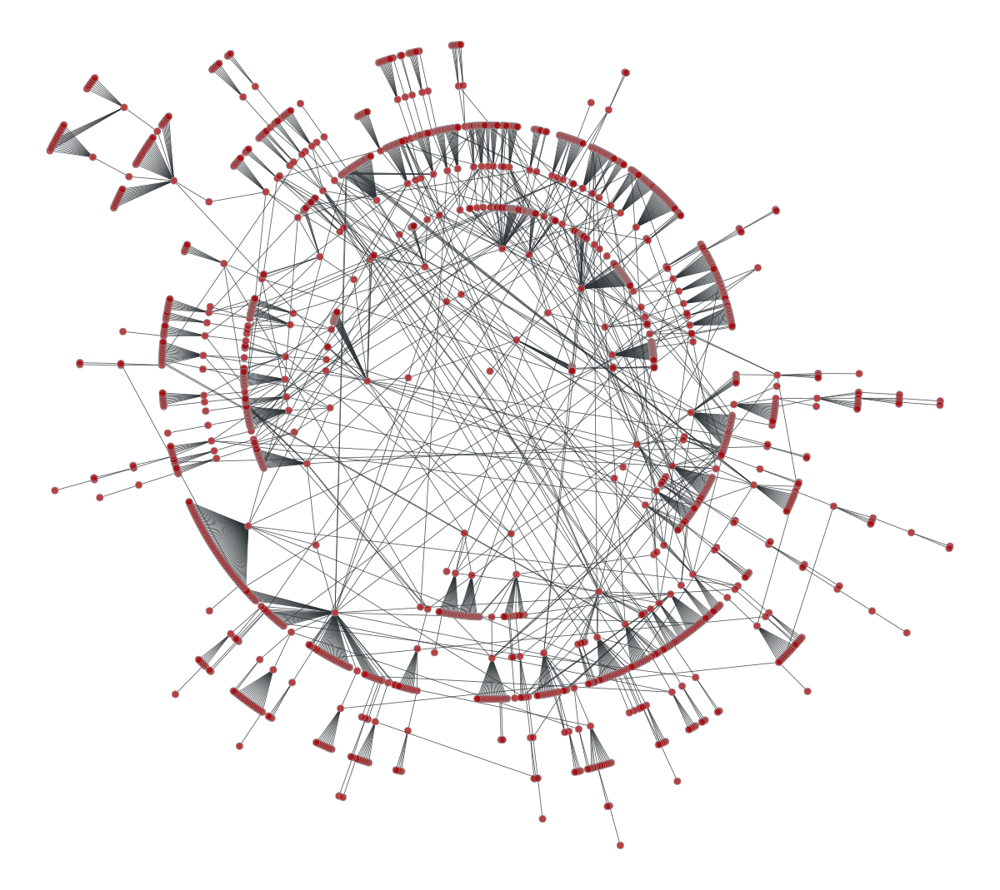

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7f5c185402e0, at 0x7f5c0900a260>

In [19]:
gt.graph_draw(u, pos_tree)

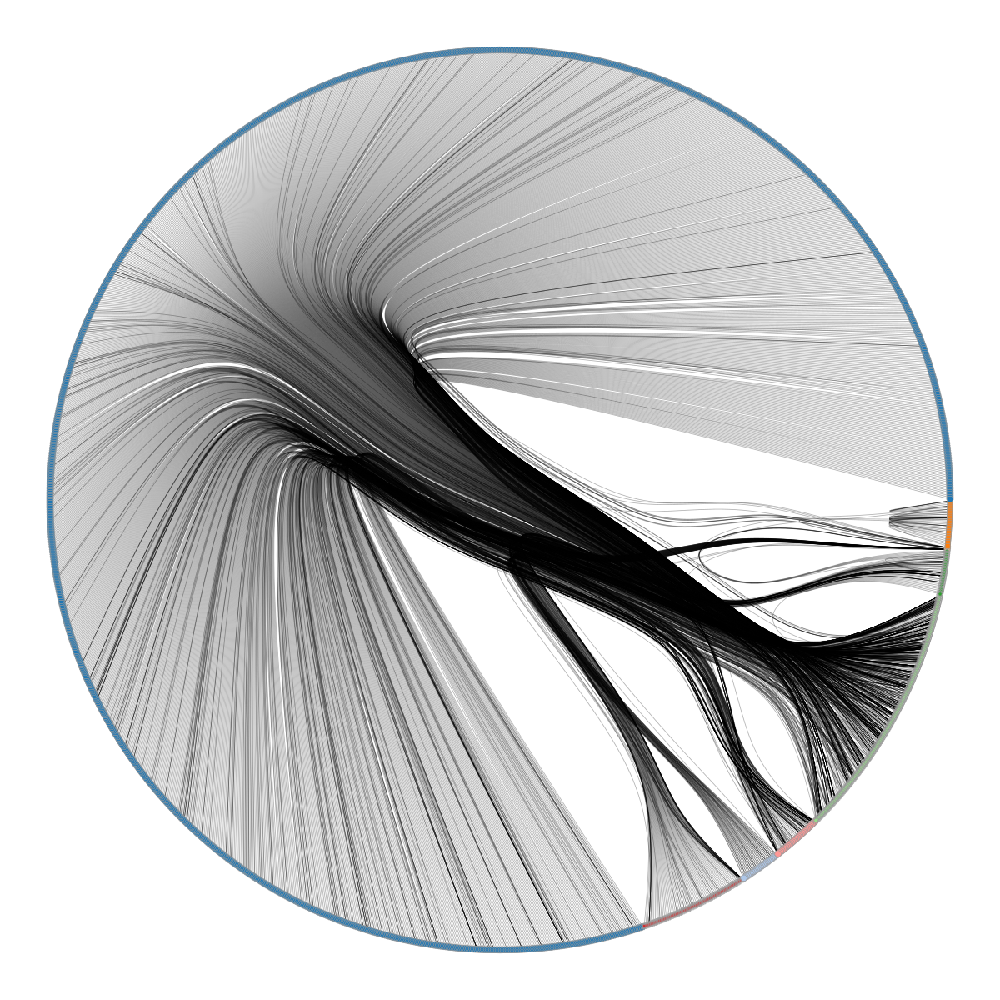

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7f5c185402e0, at 0x7f5c0900af80>

In [20]:
state = gt.minimize_nested_blockmodel_dl(u)

t = gt.get_hierarchy_tree(state)[0]

tpos = pos = gt.radial_tree_layout(t, t.vertex(t.num_vertices() - 1, use_index=False), weighted=True)

cts = gt.get_hierarchy_control_points(u, t, tpos)

pos = u.own_property(tpos)

b = state.levels[0].b

shape = b.copy()

shape.a %= 14

gt.graph_draw(u, pos=pos, vertex_fill_color=b, vertex_shape=shape, edge_control_points=cts,

              edge_color=[0, 0, 0, 0.3], vertex_anchor=0)

### shortest paths

[ 1  0  2 ...  9 10 10]


(array([  2.,  17.,   9., 174.,  66., 680., 465.,  57., 173.,  41.]),
 PropertyArray([ 0. ,  1.2,  2.4,  3.6,  4.8,  6. ,  7.2,  8.4,  9.6, 10.8,
                12. ]),
 <BarContainer object of 10 artists>)

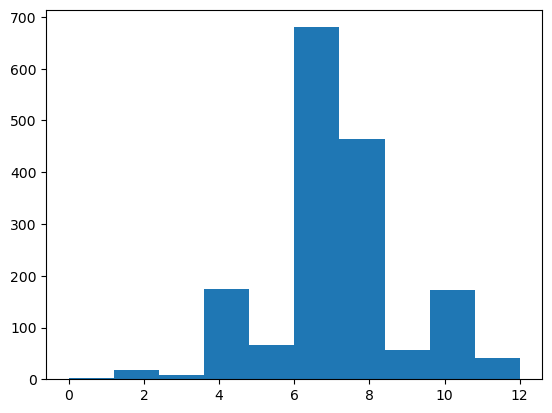

In [21]:
dist = gt.shortest_distance(u, source=u.vertex(1))

print(dist.a)

plt.hist(dist.a)

[0.00000e+00 3.84200e+03 4.47440e+04 5.12860e+04 3.29372e+05 2.11310e+05
 9.21470e+05 2.77094e+05 6.39506e+05 1.29958e+05 1.71854e+05 2.78240e+04
 2.01400e+04 3.53400e+03 1.88000e+03 2.62000e+02 9.60000e+01]


<BarContainer object of 17 artists>

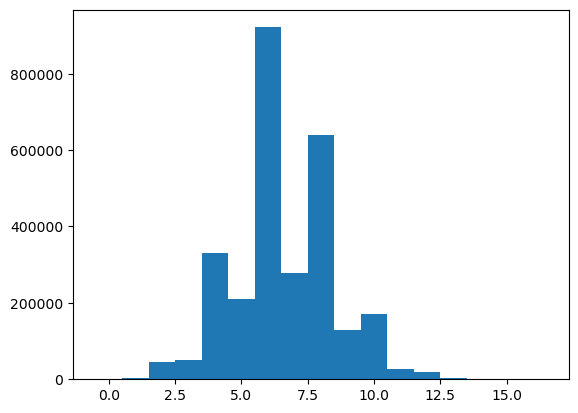

In [22]:
hist, bin_edges = gt.distance_histogram(u)
print(hist)
plt.bar(bin_edges[:-1], hist, width=1)

In [23]:
dist = gt.shortest_distance(u)

average_path_length = gt.vertex_average(u, dist)
print(np.mean(average_path_length))

3.3202706936154521452


### percolation threshold

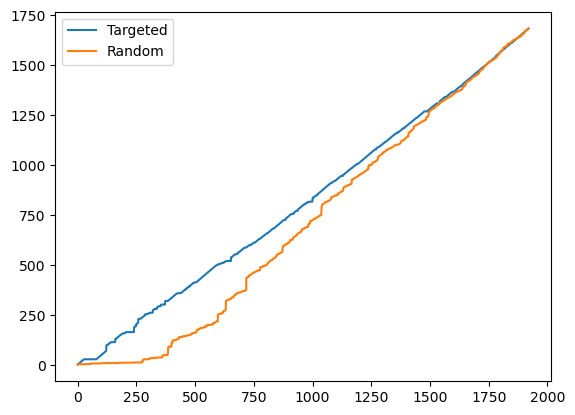

In [25]:
edges = sorted([(e.source(), e.target()) for e in u.edges()],
               key=lambda e: e[0].in_degree() * e[1].in_degree())

sizes, comp = gt.edge_percolation(u, edges)

np.random.shuffle(edges)

sizes2, comp = gt.edge_percolation(u, edges)

plt.plot(sizes, label="Targeted")

plt.plot(sizes2, label="Random")

plt.legend()

### k-core decomposition

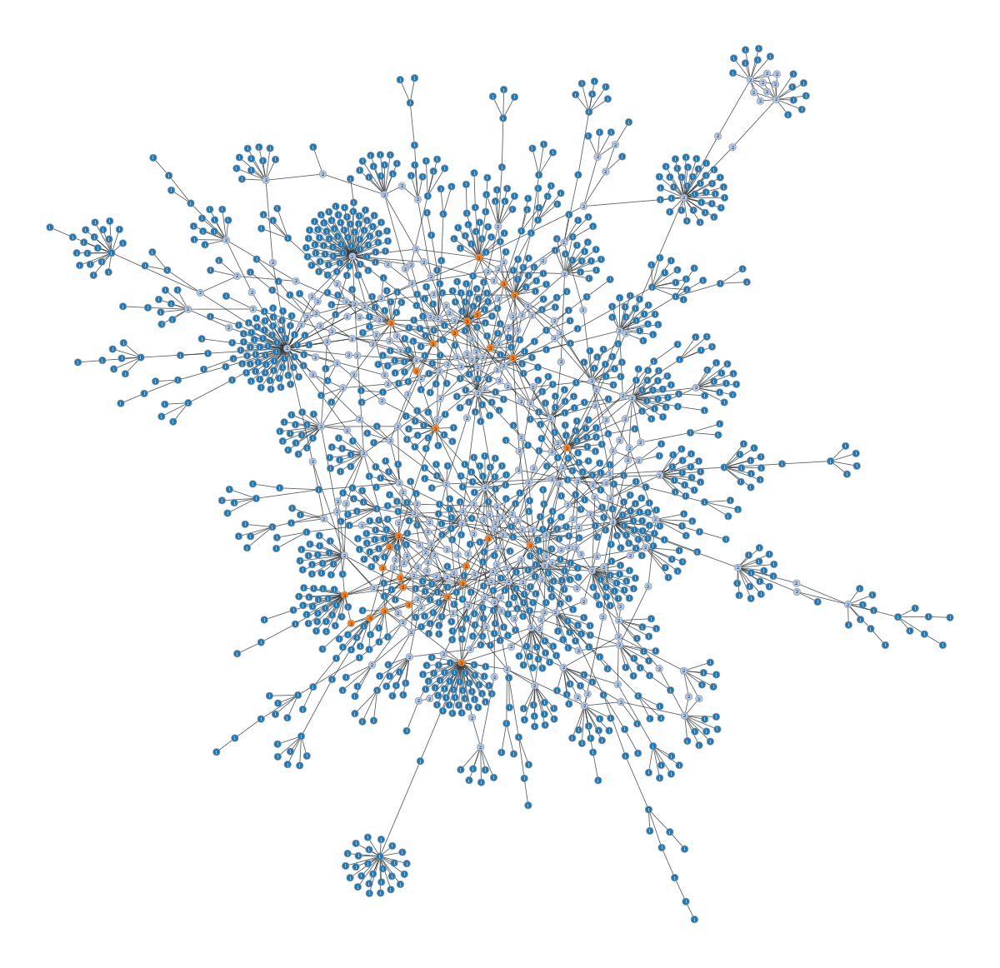

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7f5c185402e0, at 0x7f5c18663c40>

In [26]:
kcore = gt.kcore_decomposition(u)
gt.graph_draw(u, vertex_fill_color=kcore, vertex_text=kcore)

In [27]:
gt.pseudo_diameter(u)

(16.0,
 (<Vertex object with index '954' at 0x7f5c090e8890>,
  <Vertex object with index '295' at 0x7f5c090e8270>))

### centrality measures

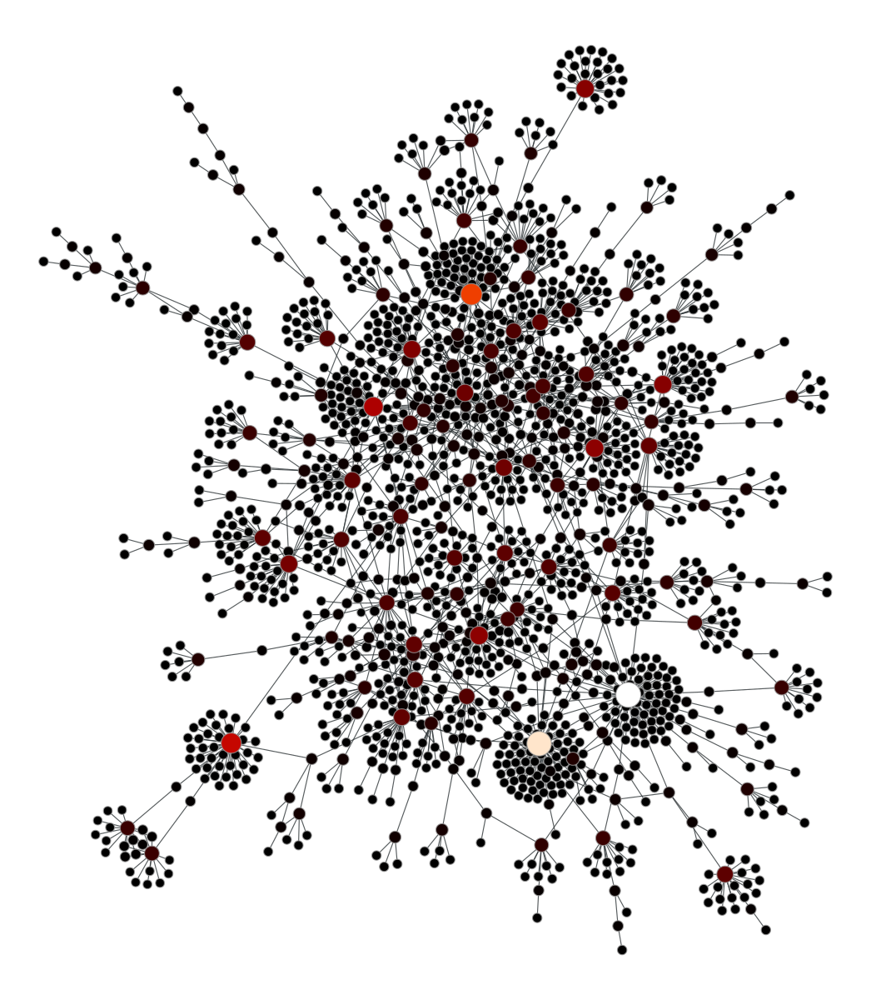

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7f5c185402e0, at 0x7f5c1876d6c0>

In [28]:
pr = gt.pagerank(u)

gt.graph_draw(u, pos=u.vp["_pos"], vertex_fill_color=pr,

              vertex_size=gt.prop_to_size(pr, mi=5, ma=15),

              vorder=pr, vcmap=matplotlib.cm.gist_heat)

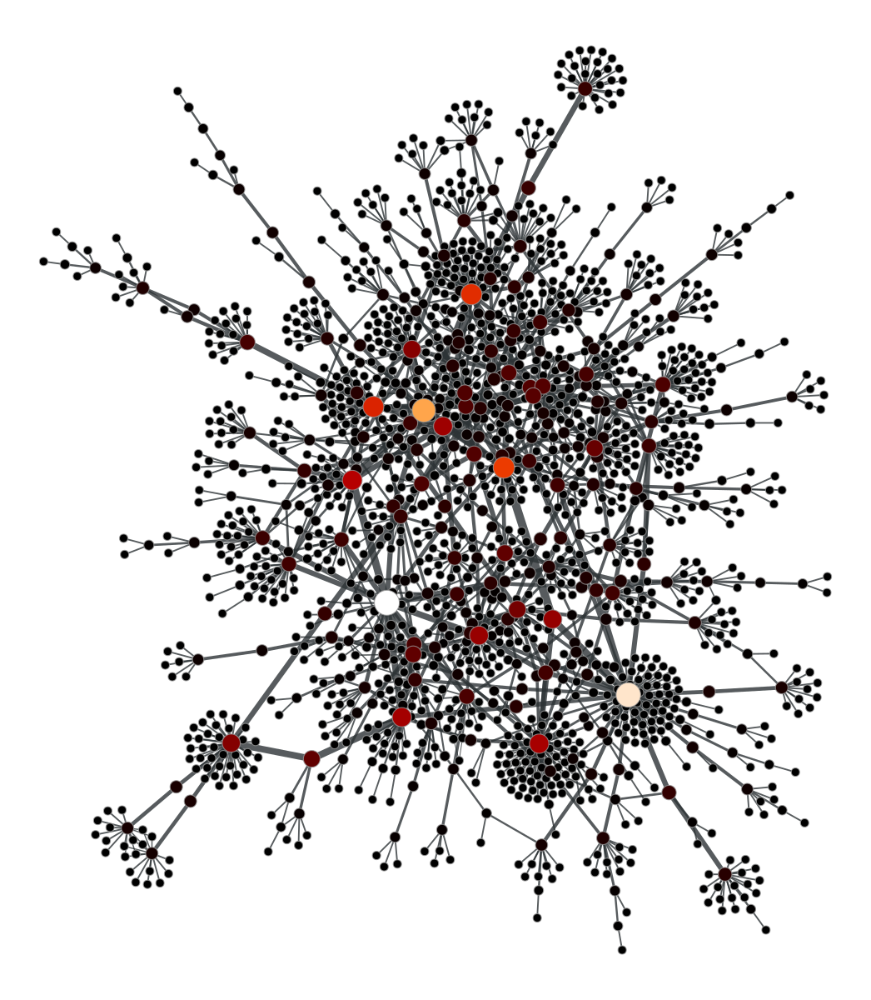

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7f5c185402e0, at 0x7f5c08f2c0a0>

In [29]:
vp, ep = gt.betweenness(u)

gt.graph_draw(u, pos=u.vp["_pos"], vertex_fill_color=vp,

              vertex_size=gt.prop_to_size(vp, mi=5, ma=15),

              edge_pen_width=gt.prop_to_size(ep, mi=0.5, ma=5),

              vcmap=matplotlib.cm.gist_heat,

              vorder=vp)

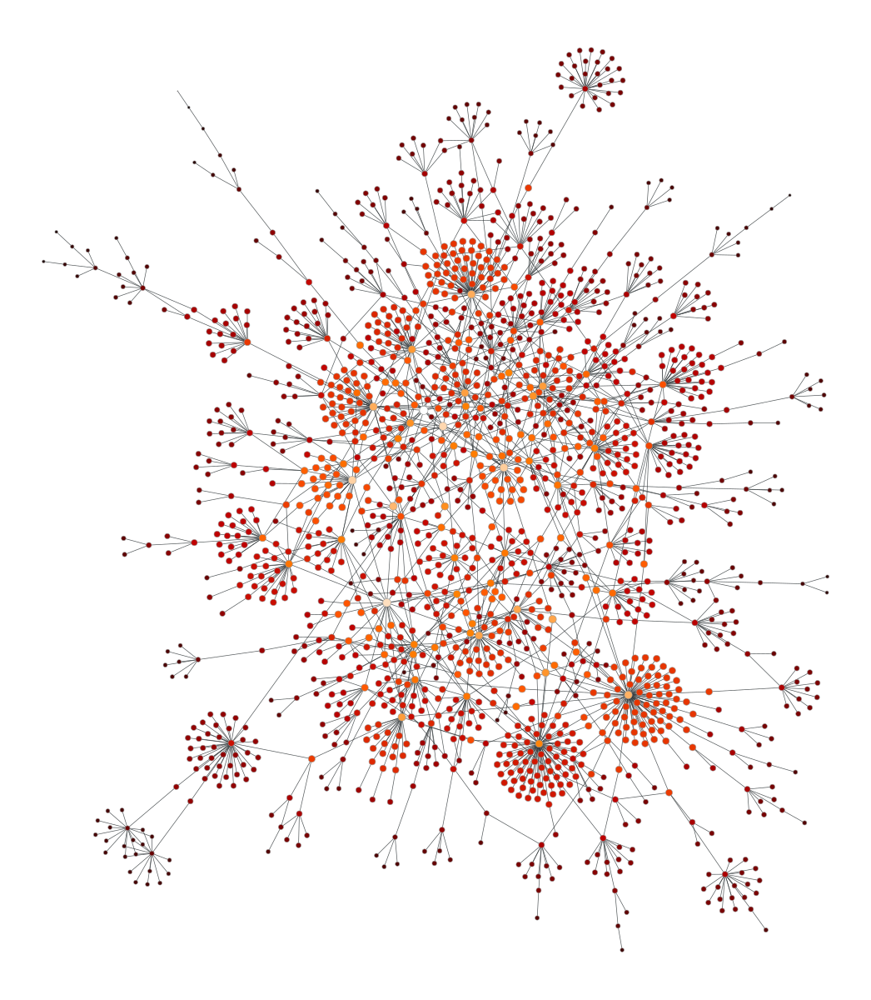

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7f5c185402e0, at 0x7f5c08f2c130>

In [30]:
c = gt.closeness(u)

gt.graph_draw(u, pos=u.vp["_pos"], vertex_fill_color=c,

              vertex_size=gt.prop_to_size(c, mi=0.5, ma=5),

              vcmap=matplotlib.cm.gist_heat,

              vorder=c)

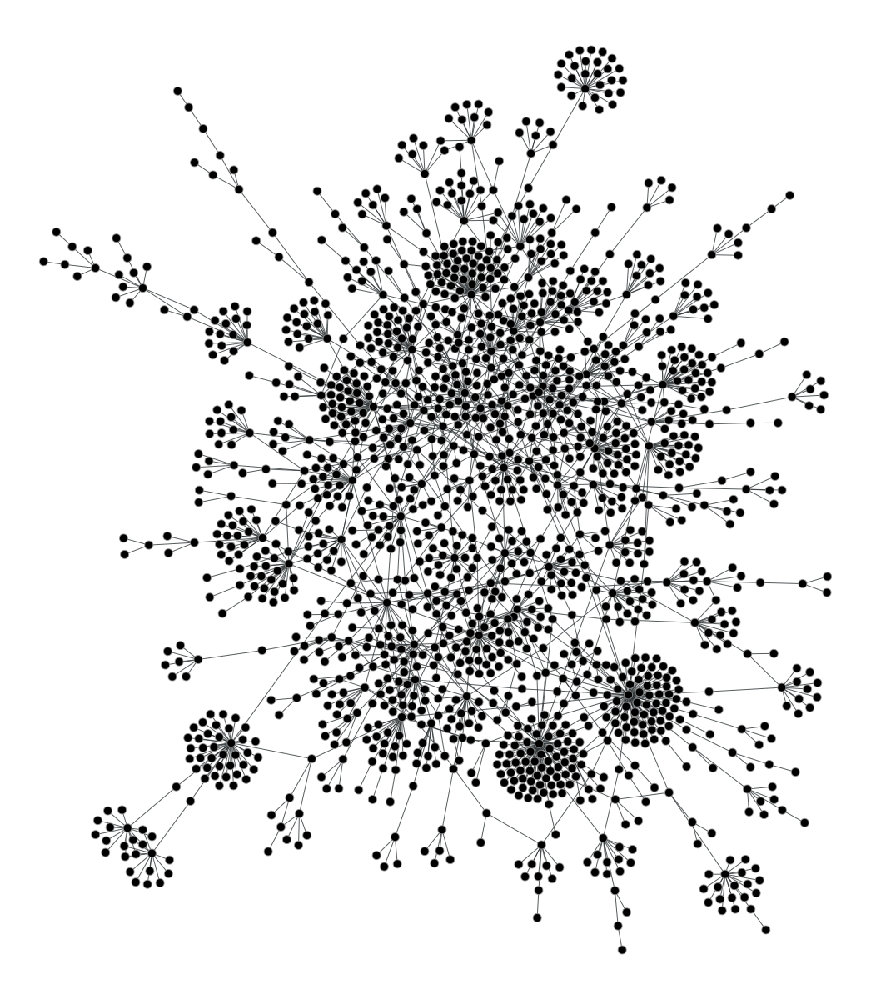

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7f5c185402e0, at 0x7f5c08d571f0>

In [33]:
if "weight" not in u.edge_properties:
    u.ep["weight"] = u.new_edge_property("double")
ee, x = gt.eigenvector(u, u.ep["weight"])

gt.graph_draw(u, pos=u.vp["_pos"], vertex_fill_color=x,

              vertex_size=gt.prop_to_size(x, mi=5, ma=15),

              vcmap=matplotlib.cm.gist_heat,

              vorder=x)

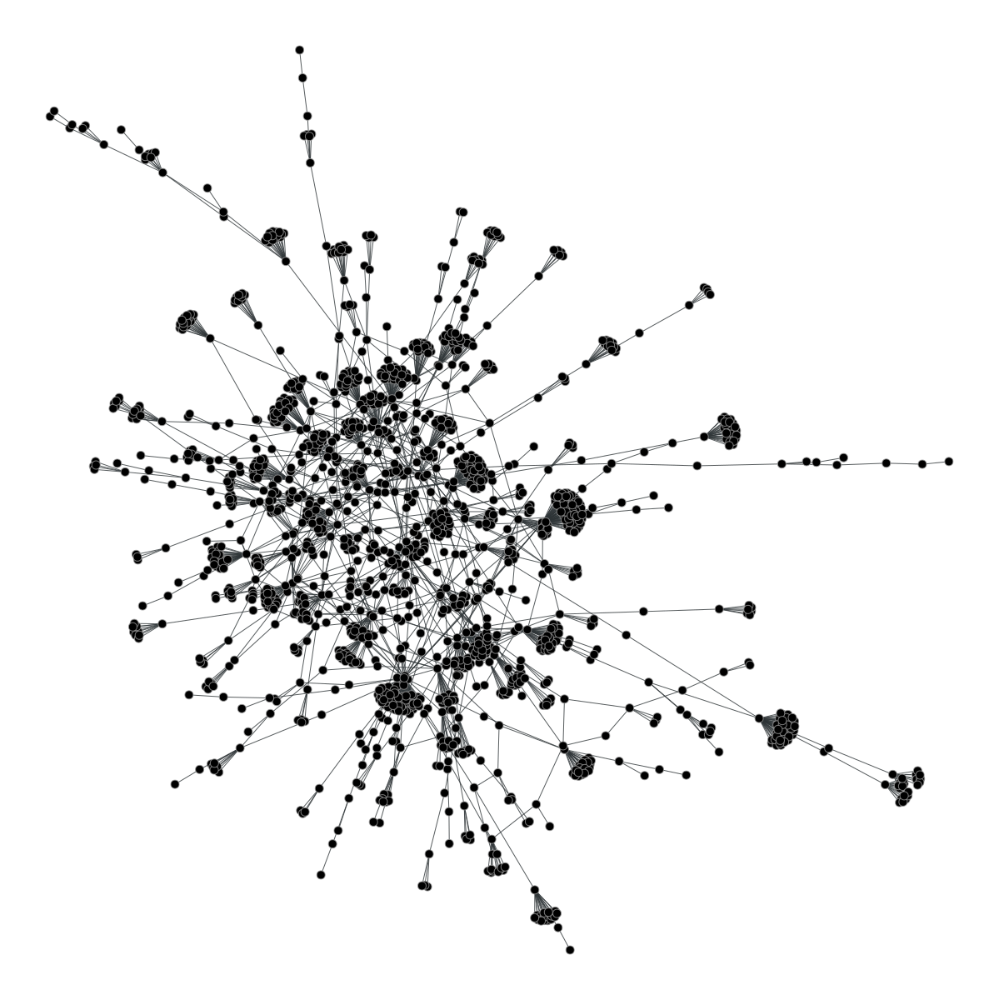

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7f5c185402e0, at 0x7f5c08d56ad0>

In [34]:
gt.graph_draw(u, pos=pos_fr, vertex_fill_color=x,

              vertex_size=gt.prop_to_size(x, mi=5, ma=15),

              vcmap=matplotlib.cm.gist_heat,

              vorder=x)

In [35]:
clust = gt.local_clustering(u)

print(gt.vertex_average(u, clust))

(0.0, 0.0)


In [36]:
print(clust.a)

[0. 0. 0. ... 0. 0. 0.]


In [37]:
out_degs = u.get_out_degrees(u.get_vertices())

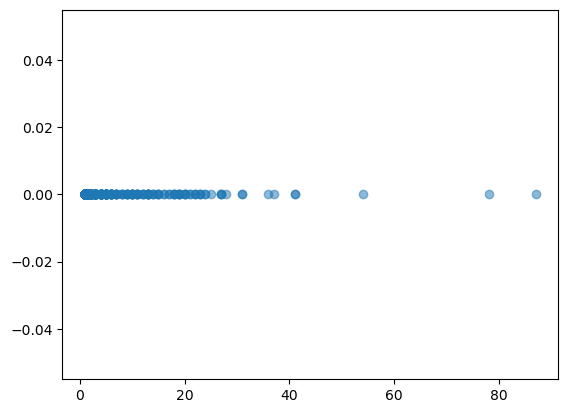

In [38]:
plt.scatter(out_degs, clust.a, alpha=0.5)

In [39]:
in_degs = u.get_in_degrees(u.get_vertices())

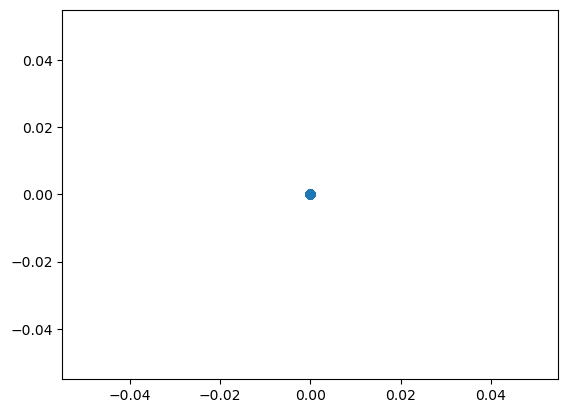

In [40]:
plt.scatter(in_degs, clust.a, alpha=0.5)

### Blockmodel

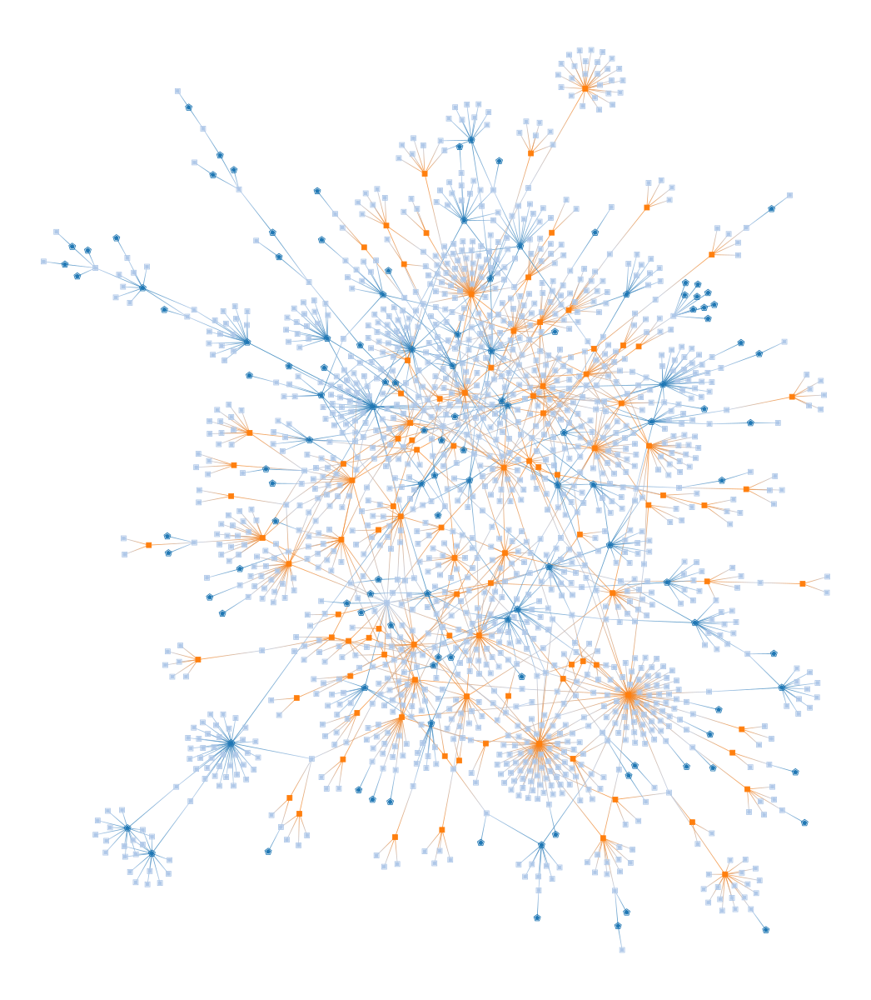

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7f5c185402e0, at 0x7f5c090a1930>

In [41]:
state = gt.minimize_blockmodel_dl(u)

state.draw(pos=u.vp["_pos"], vertex_shape=state.get_blocks())

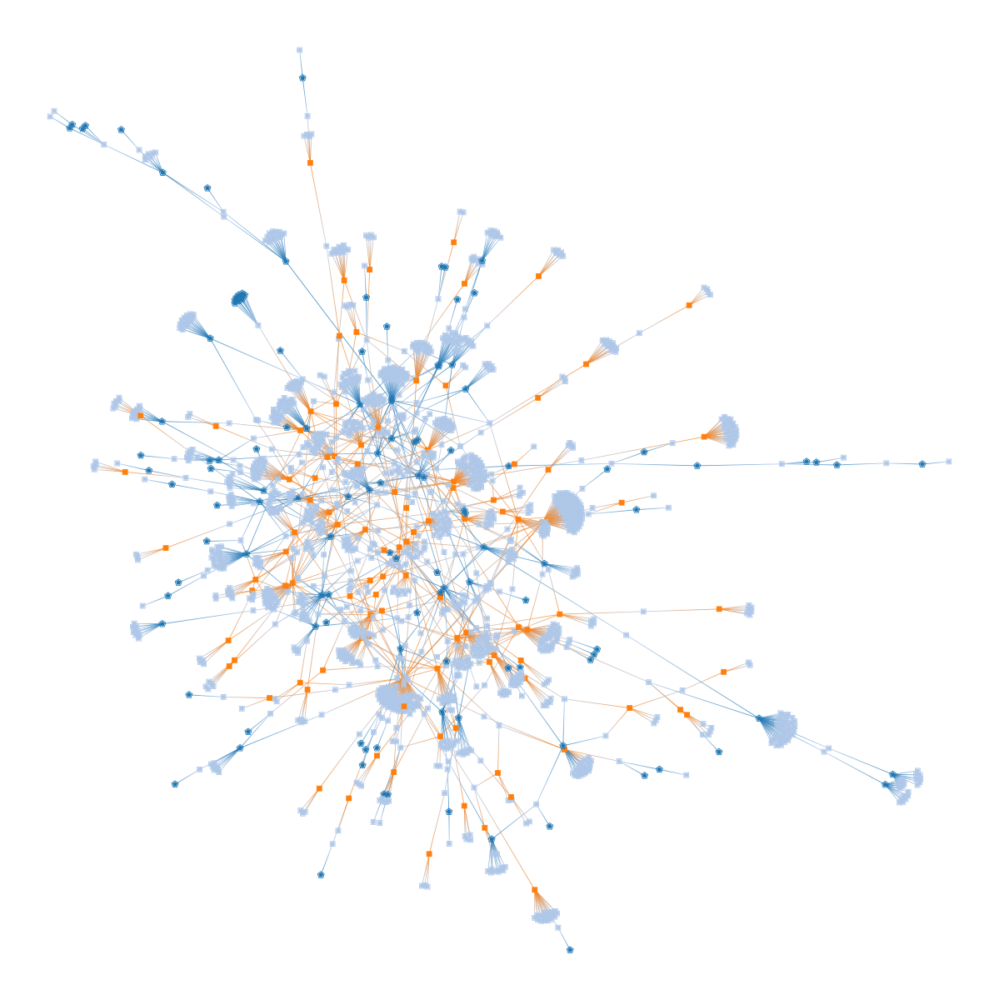

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7f5c185402e0, at 0x7f5c0900bee0>

In [42]:
state.draw(pos=pos_fr, vertex_shape=state.get_blocks())

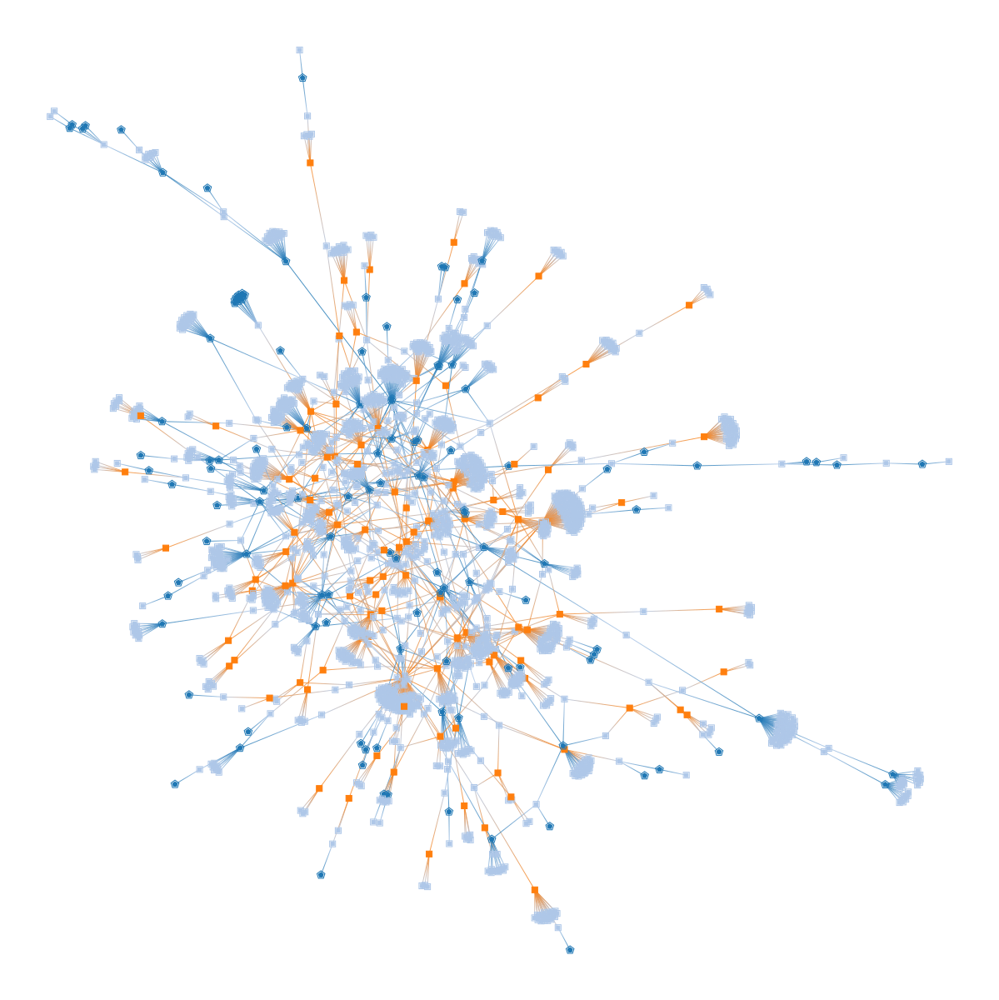

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7f5c185402e0, at 0x7f5c086a35e0>

In [43]:
state.draw(pos=pos_fr, vertex_shape=state.get_blocks(), vertex_size=gt.prop_to_size(x, mi=5, ma=25))


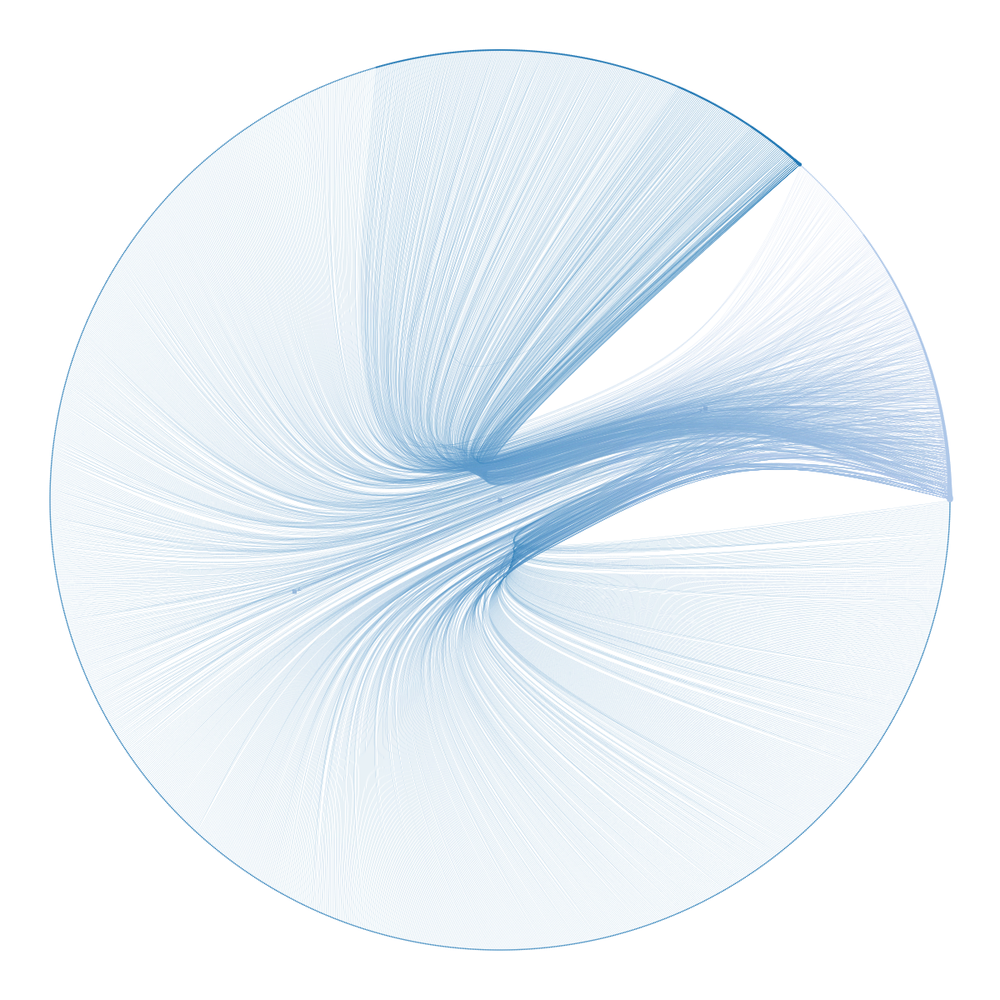

(<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7f5c185402e0, at 0x7f5c08fbd0c0>,
 <GraphView object, directed, with 1687 vertices and 1686 edges, edges filtered by (<EdgePropertyMap object with value type 'bool', for Graph 0x7f5c081d9c30, at 0x7f5c090a3f70>, False), vertices filtered by (<VertexPropertyMap object with value type 'bool', for Graph 0x7f5c081d9c30, at 0x7f5c090a2d10>, False), at 0x7f5c081d9c30>,
 <VertexPropertyMap object with value type 'vector<double>', for Graph 0x7f5c081d9c30, at 0x7f5c090a03a0>)

In [44]:
state2 = gt.minimize_nested_blockmodel_dl(u)

state2.draw()

In [45]:
print(state.get_blocks().a)

[ 218  649  649 ... 1682  649  649]


In [49]:
print(u.vertex_properties["name"].a)


KeyError: ('v', 'name')

In [53]:
u.save("eu_procurementAT2008.graphml")